##### Author: Jimin Kim (jk55@uw.edu)
##### Version 1.5.0

# Lab 3 Report

## Group Members:
Hemil Patel and Indra X
## Group Name for Leaderboard: 

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

from PIL import Image 
%matplotlib inline

In [2]:
from IPython.display import Image as ipyimage #For displaying images in colab jupyter cell

### Exercise 1: Generalized function for subsetting pixels

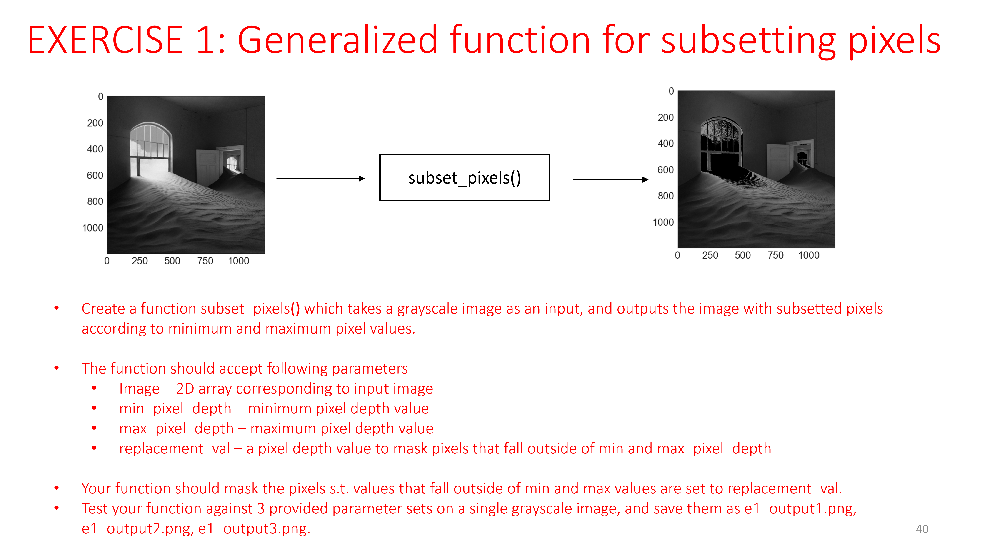

In [3]:
ipyimage('lab3_exercise1.PNG', width = 1000)

In [4]:
e1_img = Image.open('sample_image_1.jpg').convert('L')
e1_img = np.array(e1_img)     # 8-bit code grayscale

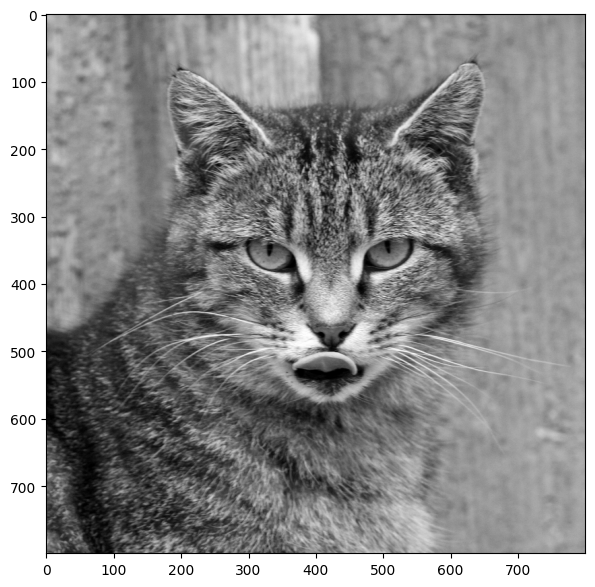

In [5]:
fig = plt.figure(figsize=(7, 7))

plt.imshow(e1_img, cmap = 'gray')

In [6]:
def subset_pixels(image, min_pixel_depth, max_pixel_depth, replacement_val):
    
    # YOUR CODE HERE
    # Make sure you create a copy of the image via new_image = image.copy() to avoid tempering the global variable
    # create copy of original
    output_image = image.copy()
    # use boolean mask to adjust values
    output_image[image < min_pixel_depth] = replacement_val
    output_image[image > max_pixel_depth] = replacement_val
    
    return output_image

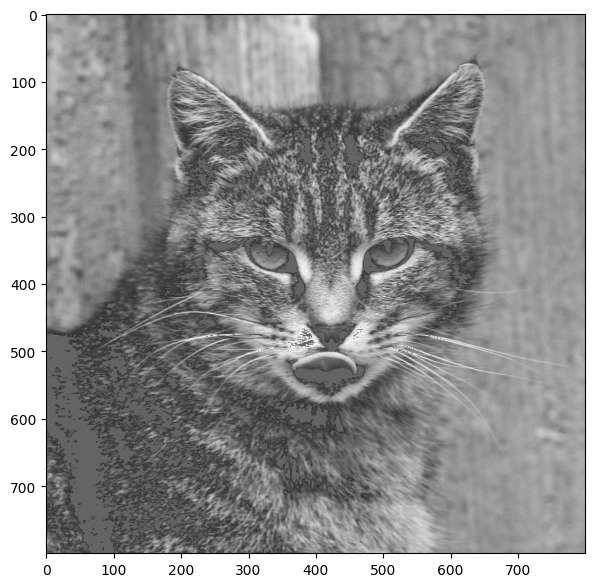

In [7]:
# min_pixel_depth = 50, max_pixel_depth = 250, replacement_val = 100

fig = plt.figure(figsize=(7, 7))

e1_output1 = subset_pixels(image = e1_img, min_pixel_depth = 50, max_pixel_depth = 250, replacement_val = 100)

plt.imshow(e1_output1, cmap = 'gray', vmin = 0, vmax = 255)

plt.savefig('e1_output1.png')

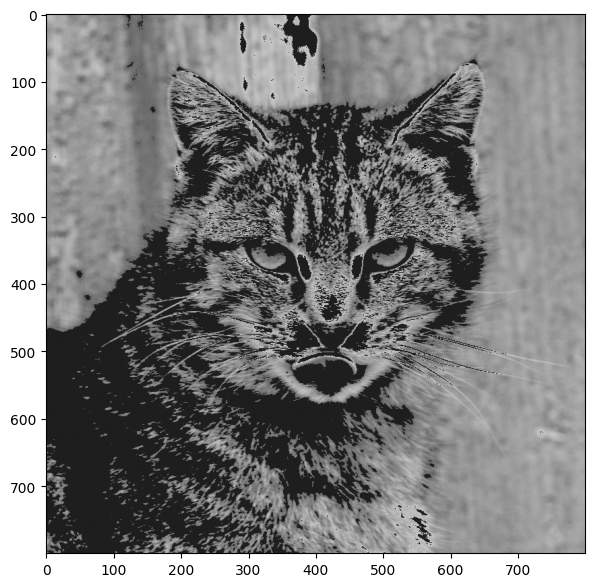

In [8]:
# min_pixel_depth = 100, max_pixel_depth = 200, replacement_val = 30

fig = plt.figure(figsize=(7, 7))

e1_output2 = subset_pixels(image = e1_img, min_pixel_depth = 100, max_pixel_depth = 200, replacement_val = 30)

plt.imshow(e1_output2, cmap = 'gray', vmin = 0, vmax = 255)

plt.savefig('e1_output2.png')

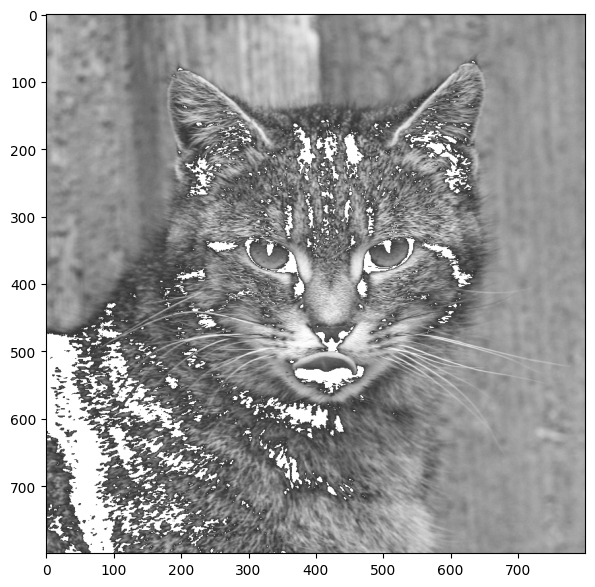

In [9]:
# min_pixel_depth = 50, max_pixel_depth = 255, replacement_val = 255

fig = plt.figure(figsize=(7, 7))

e1_output3 = subset_pixels(image = e1_img, min_pixel_depth = 50, max_pixel_depth = 255, replacement_val = 255)

plt.imshow(e1_output3, cmap = 'gray', vmin = 0, vmax = 255)

plt.savefig('e1_output3.png')

### Exercise 2: Thumbnail generator function

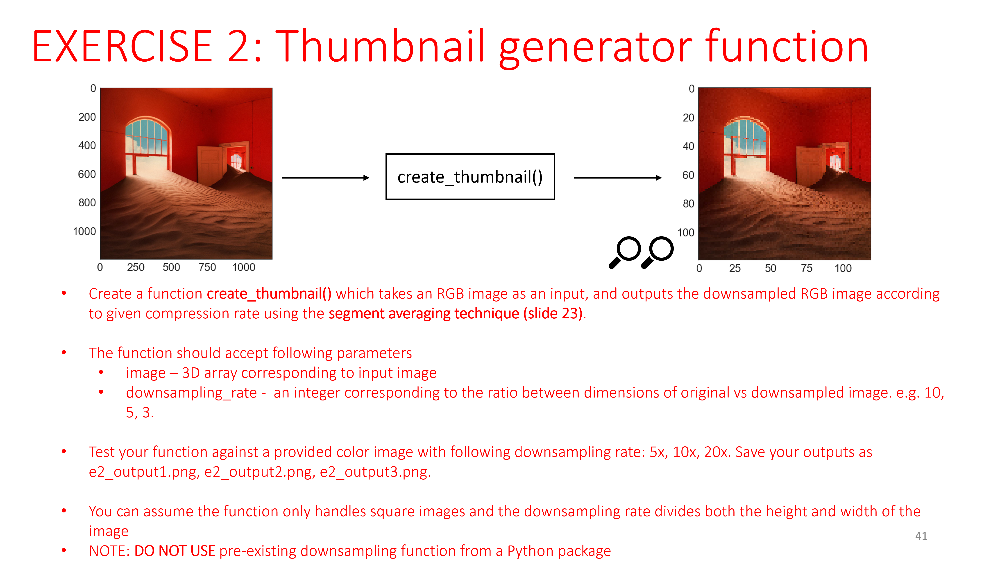

In [10]:
ipyimage('lab3_exercise2.PNG', width = 1000)

In [11]:
e2_img = mpimg.imread('sample_image_2.jpg')
e2_img = np.array(e2_img)     

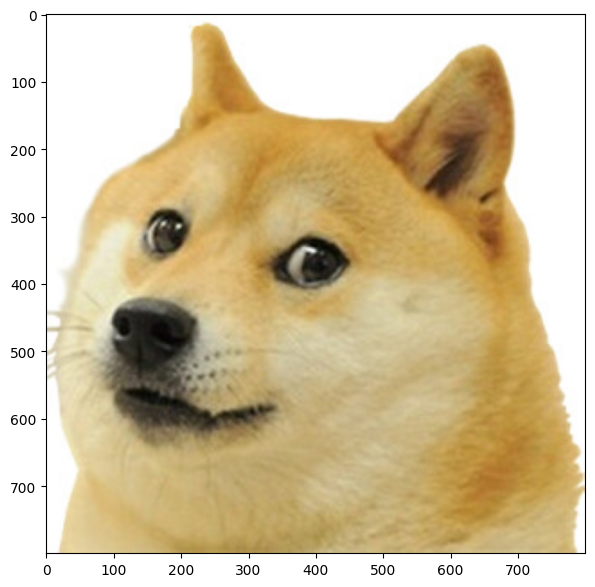

In [12]:
fig = plt.figure(figsize=(7, 7))

plt.imshow(e2_img)

In [83]:

def create_thumbnail(image, downsampling_rate):

    # save the dimensions of the original image
    height, width, channel = image.shape

    # calculate the dimensions for the new image
    new_height = height // downsampling_rate
    new_width = new_height

    # create blank area to store the new image
    output_image = np.zeros((new_height, new_width, channel), dtype=int)

    # iterate thru color channels
    for d in range(channel):
        # iterate thru the height and width of the new image
        for h in range(new_height):  
            for w in range(new_width): 

                # calculate the locations of the segments from original img that will map to the current pixel in output img
                startHeight = h * downsampling_rate
                endHeight = startHeight + downsampling_rate
                startWidth = w * downsampling_rate
                endWidth = startWidth + downsampling_rate

                # take the avg of all of the pixel vals within the designated segment
                segmentAverage = np.mean(image[startHeight:endHeight, startWidth:endWidth, d])
                # save the avg value of that segment to the proper pixel in the output image
                output_image[h, w, d] = int(round(segmentAverage))

    return output_image


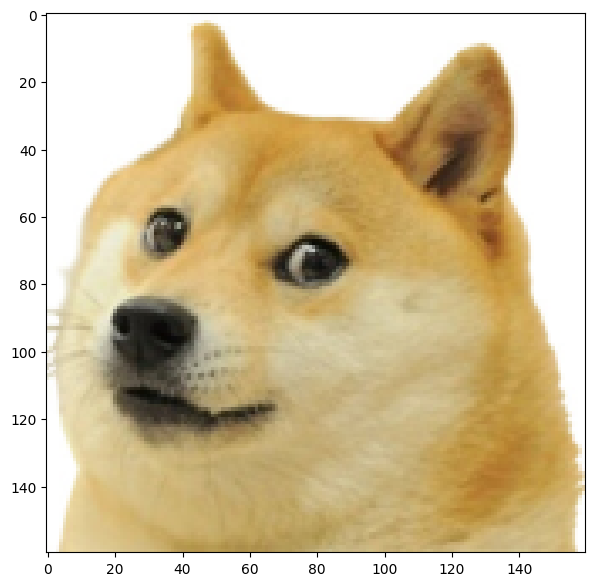

In [84]:
# downsampling rate x5

fig = plt.figure(figsize=(7, 7))

e2_output1 = create_thumbnail(image = e2_img, downsampling_rate = 5)

plt.imshow(e2_output1, vmin = 0, vmax = 255)

plt.savefig('e2_output1.png')

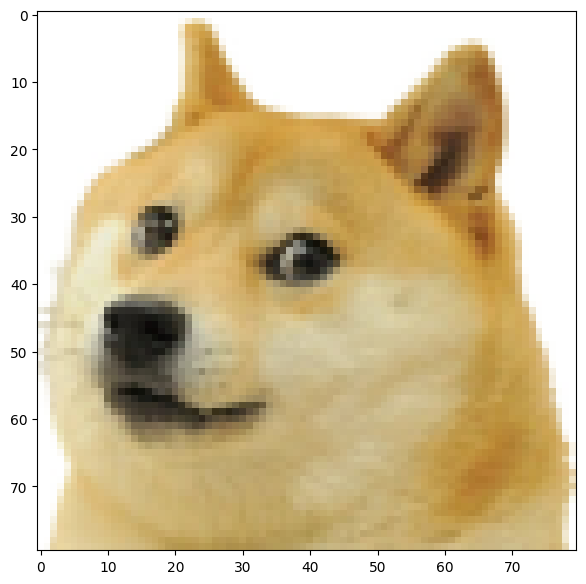

In [85]:
# downsampling rate x10

fig = plt.figure(figsize=(7, 7))

e2_output2 = create_thumbnail(image = e2_img, downsampling_rate = 10)

plt.imshow(e2_output2, vmin = 0, vmax = 255)

plt.savefig('e2_output2.png')

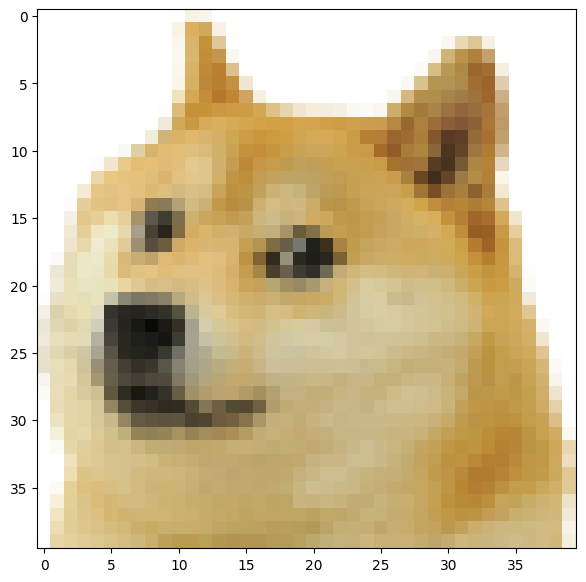

In [86]:
# downsampling rate x20

fig = plt.figure(figsize=(7, 7))

e2_output3 = create_thumbnail(image = e2_img, downsampling_rate = 20)

plt.imshow(e2_output3, vmin = 0, vmax = 255)

plt.savefig('e2_output3.png')

## Extra credit: Code efficiency
### Achieve a runtime speed of < 100ms

In [87]:
timeit -n 1 -r 7 e2_output2 = create_thumbnail(image = e2_img, downsampling_rate = 5)

849 ms ± 56.3 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


### Exercise 3: Generalized image blender function

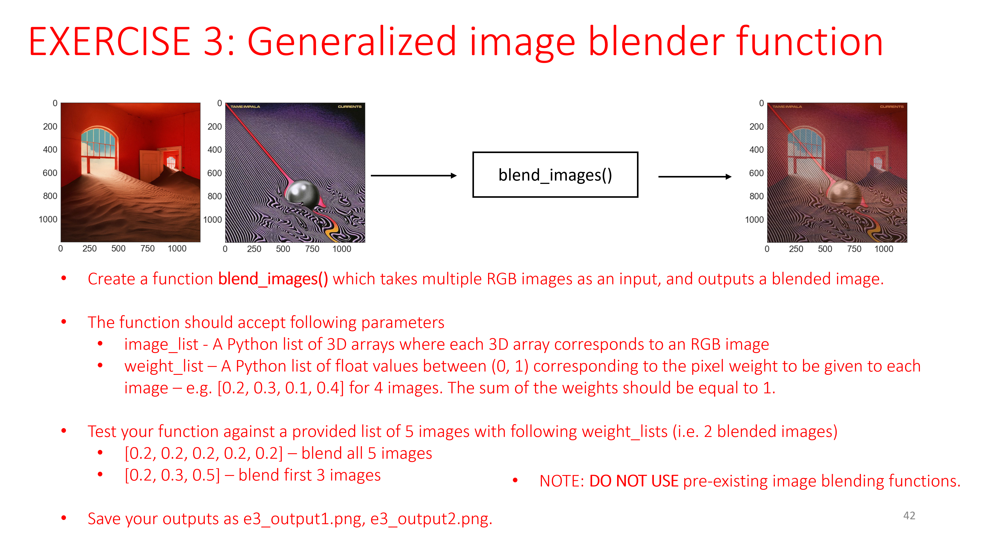

In [88]:
ipyimage('lab3_exercise3.PNG', width = 1000)

In [89]:
e3_img1 = mpimg.imread('sample_image_1.jpg')
e3_img2 = mpimg.imread('sample_image_2.jpg')
e3_img3 = mpimg.imread('sample_image_3.jpg')
e3_img4 = mpimg.imread('sample_image_4.jpg')
e3_img5 = mpimg.imread('sample_image_5.jpg')

e3_img1 = np.array(e3_img1)     
e3_img2 = np.array(e3_img2)     
e3_img3 = np.array(e3_img3)     
e3_img4 = np.array(e3_img4)     
e3_img5 = np.array(e3_img5)     

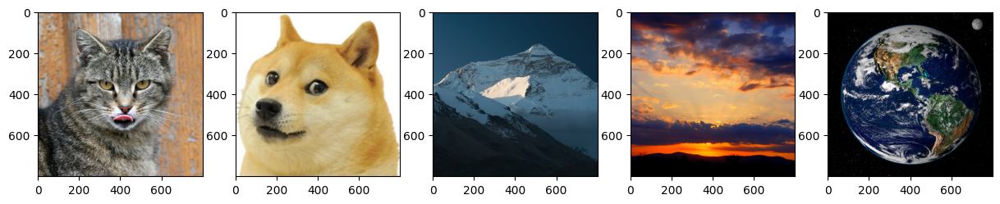

In [90]:
fig = plt.figure(figsize=(15, 15))

plt.subplot(1,5,1)
plt.imshow(e3_img1, vmin = 0, vmax = 255)

plt.subplot(1,5,2)
plt.imshow(e3_img2, vmin = 0, vmax = 255)

plt.subplot(1,5,3)
plt.imshow(e3_img3, vmin = 0, vmax = 255)

plt.subplot(1,5,4)
plt.imshow(e3_img4, vmin = 0, vmax = 255)

plt.subplot(1,5,5)
plt.imshow(e3_img5, vmin = 0, vmax = 255)

In [91]:
def blend_images(image_list, weight_list):
    
    # YOUR CODE HERE

    # length of lists are the same
    image_num = len(image_list)

    # the indices will be same on both lists when using them
    for k in range(image_num):

        # retreive the image as a 3d array and the weight as a scalar
        image = image_list[k]
        weight = weight_list[k]

        # normalize each img by multiplying the scalar by the array using array wide op
        # stack onto final image
        output_image = np.stack(np.multiply(image, weight))
    
    return output_image

In [ ]:
# Blend all 5 images with equal weights

e3_part1_image_list =[e3_img1, e3_img2, e3_img3, e3_img4, e3_img5]
e3_part1_weight_list = [0.2, 0.2, 0.2, 0.2, 0.2]

e3_output1 = blend_images(image_list = e3_part1_image_list, weight_list = e3_part1_weight_list)

fig = plt.figure(figsize=(7, 7))

plt.imshow(e3_output1, vmin = 0, vmax = 255)

plt.savefig('e3_output1.png')

In [ ]:
# Blend first 3 images with different weights

e3_part2_image_list =[e3_img1, e3_img2, e3_img3]
e3_part2_weight_list = [0.2, 0.3, 0.5]

e3_output2 = blend_images(image_list = e3_part2_image_list, weight_list = e3_part2_weight_list)

fig = plt.figure(figsize=(5, 5))

plt.imshow(e3_output2, vmin = 0, vmax = 255)

plt.savefig('e3_output2.png')

### Exercise 4: Image rotation function

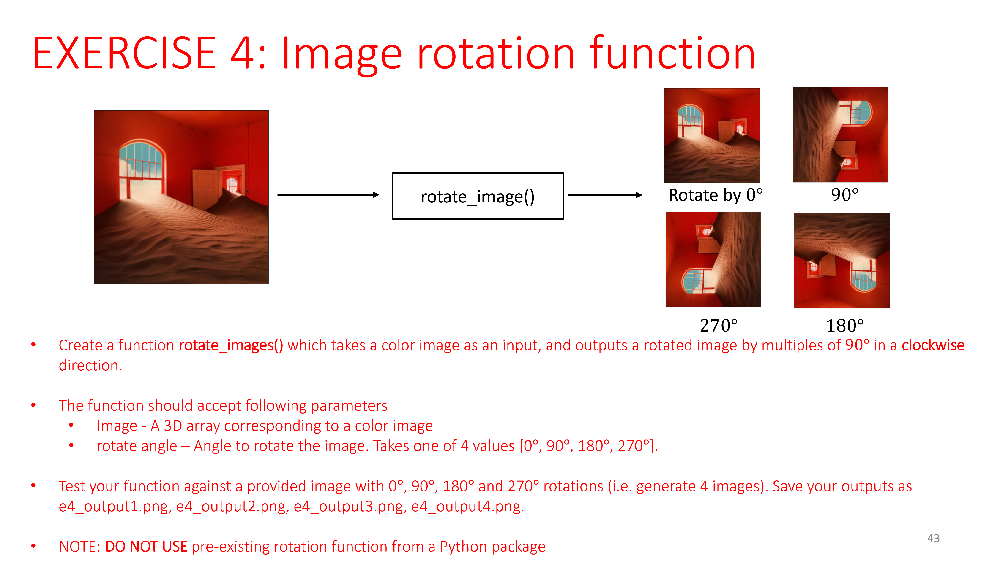

In [5]:
ipyimage('lab3_exercise4.PNG', width = 1000)

In [ ]:
e4_img = mpimg.imread('sample_image_2.jpg')
e4_img = np.array(e4_img)     

In [ ]:
fig = plt.figure(figsize=(7, 7))

plt.imshow(e4_img, vmin = 0, vmax = 255)

In [ ]:
def rotate_image(image, rotate_angle): # rotate angle takes one of 0, 90, 180, 270
    
    # YOUR CODE HERE
    # Make sure you create a copy of the image via new_image = image.copy() to avoid tempering the global variable
    
    return output_image

In [ ]:
# Rotate the image by 0 degrees - This should result in identity

e4_output1 = rotate_image(image = e4_img, rotate_angle = 0)

fig = plt.figure(figsize=(7, 7))

plt.imshow(e4_output1, vmin = 0, vmax = 255)

plt.savefig('e4_output1.png')

In [ ]:
# Rotate the image by 90 degrees

e4_output2 = rotate_image(image = e4_img, rotate_angle = 90)

fig = plt.figure(figsize=(7, 7))

plt.imshow(e4_output2, vmin = 0, vmax = 255)

plt.savefig('e4_output2.png')

In [ ]:
# Rotate the image by 180 degrees

e4_output3 = rotate_image(image = e4_img, rotate_angle = 180)

fig = plt.figure(figsize=(7, 7))

plt.imshow(e4_output3, vmin = 0, vmax = 255)

plt.savefig('e4_output3.png')

In [ ]:
# Rotate the image by 270 degrees

e4_output4 = rotate_image(image = e4_img, rotate_angle = 270)

fig = plt.figure(figsize=(7, 7))

plt.imshow(e4_output4, vmin = 0, vmax = 255)

plt.savefig('e4_output4.png')

## Extra credit: Code efficiency
### Achieve a runtime speed of < 5ms

In [ ]:
timeit -n 1 -r 7 e4_output2 = rotate_image(image = e4_img, rotate_angle = 90)

### Exercise 5: 2D Gaussian image generator

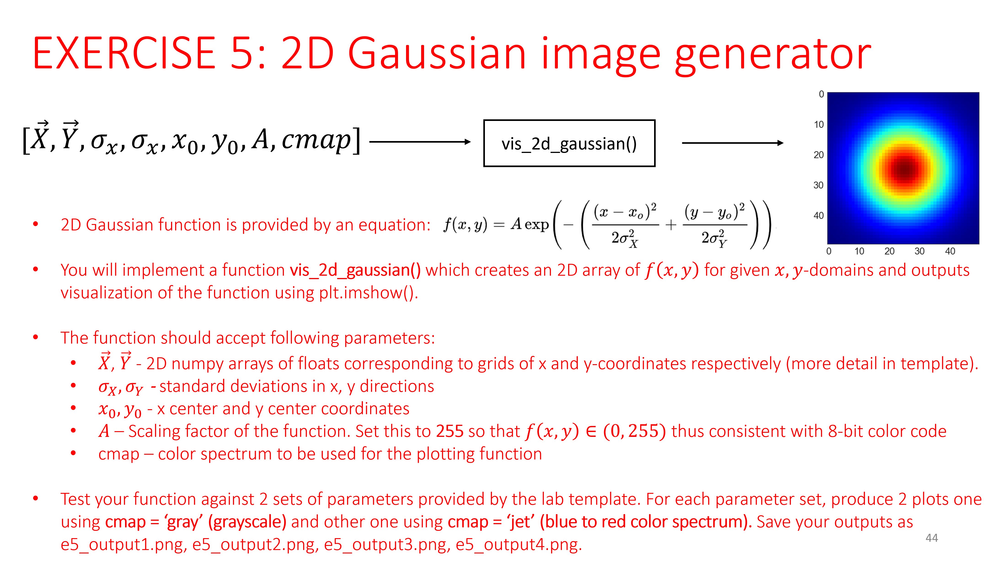

In [6]:
ipyimage('lab3_exercise5.PNG', width = 1000)

In [ ]:
x_range = np.arange(-25, 25, 1)
y_range = np.arange(-25, 25, 1)[::-1]

X, Y = np.meshgrid(x_range, y_range) # More detail on documentation 
                                     # https://numpy.org/doc/stable/reference/generated/numpy.meshgrid.html

In [ ]:
print(X, X.shape) # Set of x-coordinates in the function domain     

In [ ]:
print(Y, Y.shape) # Set of y-coordinates in the function domain   

In [ ]:
def vis_2d_gaussian(X, Y, sigma_x, sigma_y, x0, y0, A, cmap):

    # YOUR CODE HERE


In [ ]:
# First parameter set: sigma_x = 10, sigma_y = 10, x0 = 0, y0 = 0
# cmap = 'gray'

fig = plt.figure(figsize=(7, 7))

vis_2d_gaussian(X, Y, sigma_x = 10, sigma_y = 10, x0 = 0, y0 = 0, A = 255, cmap = 'gray')

plt.savefig('e5_output1.png')

In [ ]:
# First parameter set
# cmap = 'jet'

fig = plt.figure(figsize=(7, 7))

vis_2d_gaussian(X, Y, sigma_x = 10, sigma_y = 10, x0 = 0, y0 = 0, A = 255, cmap = 'jet')

plt.savefig('e5_output2.png')

In [ ]:
# Second parameter set: sigma_x = 5, sigma_y = 5, x0 = 3, y = 3
# grayscale color specturm

fig = plt.figure(figsize=(7, 7))

vis_2d_gaussian(X, Y, sigma_x = 5, sigma_y = 5, x0 = 3, y0 = 3, A = 255, cmap = 'gray')

plt.savefig('e5_output1.png')

In [ ]:
# Second parameter set: sigma_x = 5, sigma_y = 5, x0 = 3, y = 3
# jet color specturm

fig = plt.figure(figsize=(7, 7))

vis_2d_gaussian(X, Y, sigma_x = 5, sigma_y = 5, x0 = 3, y0 = 3, A = 255, cmap = 'jet')

plt.savefig('e5_output2.png')